In [1]:
import sys

sys.path.append("..")

%load_ext autoreload
%autoreload complete

In [167]:
from pathlib import Path
import pickle

import pandas as pd
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from cfr import ProxyDatabase
import cfr
from tqdm import tqdm
import xesmf as xe
import nc_time_axis

from lmrecon.grid import GLOBAL_GRID
from lmrecon.plotting import plot_field, subplots_cartopy
from lmrecon.util import get_base_path, get_closest_gridpoint, get_closest_gridpoint_with_data, get_data_path
from lmrecon.io import open_mfdataset
from lmrecon.stats import area_weighted_mean, average_annually, average_seasonally, annualize_seasonal_data, rmse, area_weighted_rmse
from lmrecon.psm import LinearPSM, ReducedSpacePSM
from lmrecon.time import map_season_to_decimal, map_decimal_to_season, Season, convert_decimal_year_to_datetime, convert_datetime_to_decimal_year, use_tuple_time_coords, use_decimal_year_time_coords
from lmrecon.mapper import PhysicalSpaceForecastSpaceMapper
from lmrecon.datasets import load_gistemp, load_ersst
from lmrecon.scripts.calibrate_psms import get_candidate_fields_for_proxy_type

Slicing ProxyRecord: 100%|██████████| 877/877 [00:04<00:00, 190.07it/s] 


(<Figure size 2000x2000 with 1 Axes>, {'map': <GeoAxes: >})

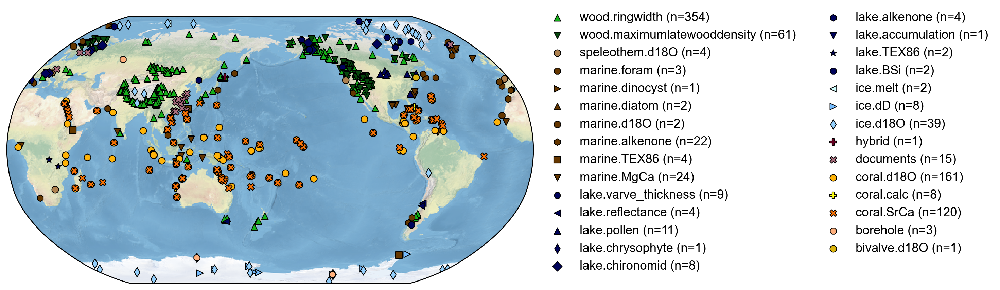

In [127]:
pdb = pickle.load((get_base_path() / "datasets/proxies/combined.pkl").open("rb"))
pdb = pdb.slice((1, 2001))
pdb.plot()

In [128]:
assert np.all([p.time_unit == "yr" for p in pdb.records.values()])
n_seasonal_to_annual = len(pdb.filter(by="dt", keys=(0.26, 0.99)).records)
if n_seasonal_to_annual > 0:
    print(f"Discarding {n_seasonal_to_annual} proxies since they have a resolution between seasonal and annual")

Discarding 2 proxies since they have a resolution between seasonal and annual


In [168]:
def seasonalize_subseasonal_proxies(pdb):
    """Average all proxies with temporal resolution below seasonal to seasonal resolution"""
    seasonalized_proxies = {}
    for key, proxy in tqdm(pdb.records.items()):
        # Some timestamps are for beginning, but more for center of interval
        # -> don't shift time axis to center interval
        # Would require detection of which convention is used
        da = xr.DataArray(proxy.value, coords=dict(time=proxy.time))
        da_seasonal = average_seasonally(da, weight_months=False)

        proxy = proxy.copy()
        proxy.time = da_seasonal.time.data
        proxy.value = da_seasonal.data
        proxy.dt = 1 / 4

        seasonalized_proxies[key] = proxy

    return ProxyDatabase(seasonalized_proxies)

In [169]:
pdb_subseasonal = pdb.filter(by="dt", keys=(0, 0.24))
pdb_seasonal = seasonalize_subseasonal_proxies(pdb_subseasonal) + pdb.filter(by="dt", keys=(0.24, 0.26))
# pdb_seasonal = shift_seasonal_proxies(pdb.filter(by="dt", keys=(0.24, 0.26)))
# pdb_seasonal = seasonalize_subseasonal_proxies(pdb_ice) 

100%|██████████| 211/211 [00:00<00:00, 350.85it/s]


(<Figure size 2000x2000 with 1 Axes>, {'map': <GeoAxes: >})

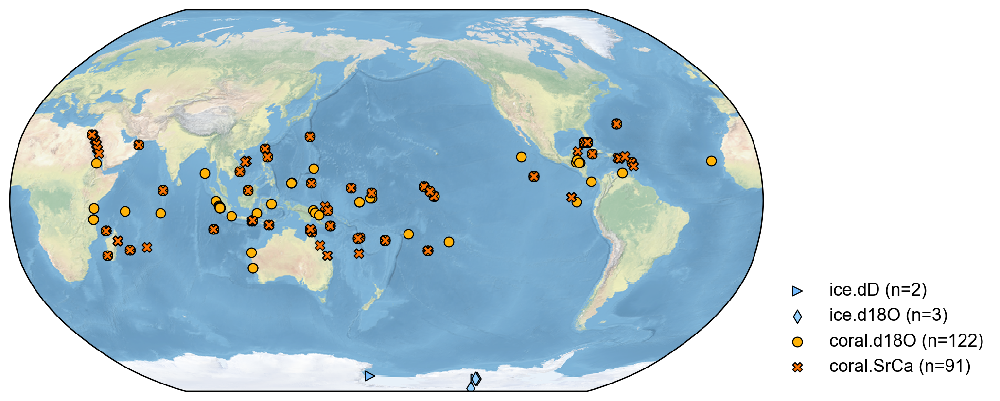

In [157]:
pdb_seasonal.plot()

Text(0.5, 1.0, 'pages2k_Ant_008 (ice.d18O)')

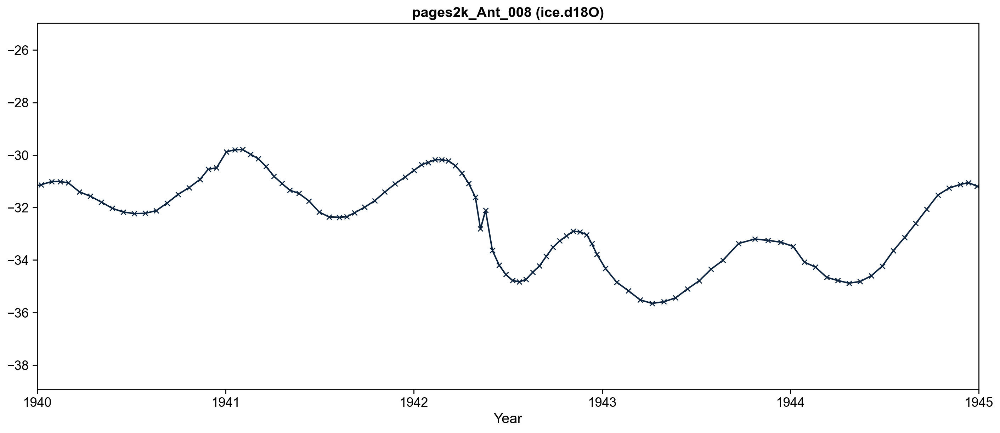

In [28]:
p = pdb_subseasonal["pages2k_Ant_008"]
plt.figure()
plt.plot(p.time, p.value, "-x")
plt.xlim(1940, 1945)
plt.xlabel("Year")
plt.title(f"{p.pid} ({p.ptype})")

In [170]:
def ensure_annual_resolution(pdb):
    """
    Ensure that all nominally annual-resolition proxies only have one data point per year.
    Some annual proxies have two values in some years, or have non-integer timestamps.
    """
    annual_proxies = {}
    for key, proxy in tqdm(pdb.records.items()):
        da = xr.DataArray(proxy.value, coords=dict(time=proxy.time))
        da_annual = da.groupby(da.time.astype(int)).mean()

        proxy = proxy.copy()
        proxy.time = da_annual.time.data
        proxy.value = da_annual.data
        proxy.dt = 1

        annual_proxies[key] = proxy

    return ProxyDatabase(annual_proxies)

100%|██████████| 530/530 [00:00<00:00, 774.50it/s] 


(<Figure size 2000x2000 with 1 Axes>, {'map': <GeoAxes: >})

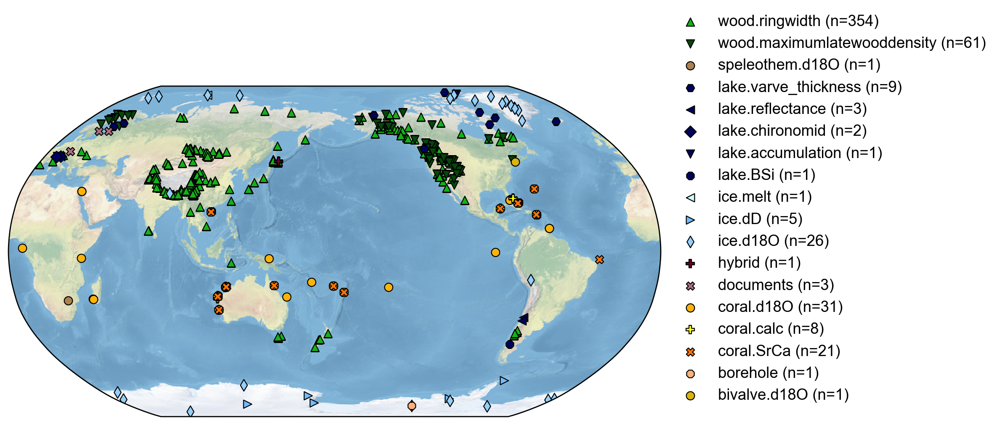

In [171]:
pdb_annual = ensure_annual_resolution(pdb.filter(by="dt", keys=(0.99, 1.01)))
pdb_annual.plot()

Discarding 125 proxies since they have multiannual resulution


(<Figure size 2000x2000 with 1 Axes>, {'map': <GeoAxes: >})

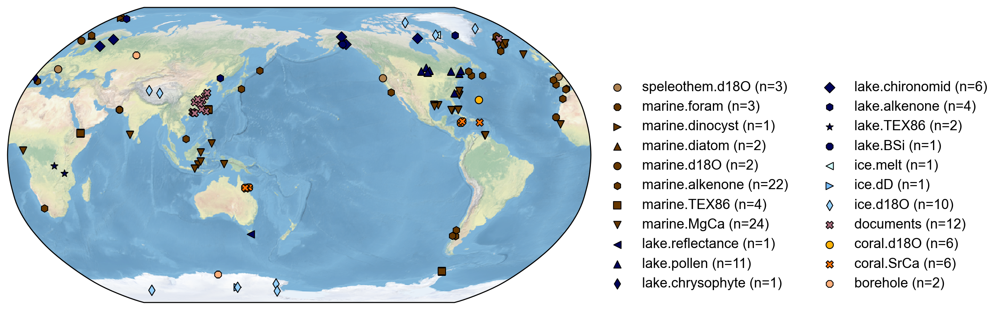

In [134]:
pdb_multiannual = pdb.filter(by="dt", keys=(1.01, np.inf))
print(f"Discarding {len(pdb_multiannual.records)} proxies since they have multiannual resulution")
pdb_multiannual.plot()

In [31]:
mapper_id = "2025-04-04T17-47-00"
mapper = PhysicalSpaceForecastSpaceMapper.load(get_base_path() / f"lmrecon/mapper/{mapper_id}/mapper.pkl")

In [32]:
da_tas = load_gistemp()["tas"].sel(time=slice(1900, None))
da_tas

<xarray.DataArray 'tas' (time: 498, lat: 90, lon: 180)> Size: 32MB
dask.array<getitem, shape=(498, 90, 180), dtype=float32, chunksize=(498, 90, 180), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) float64 4kB 1.9e+03 1.9e+03 ... 2.024e+03 2.024e+03
  * lon      (lon) float64 1kB 0.0 2.0 4.0 6.0 8.0 ... 352.0 354.0 356.0 358.0
  * lat      (lat) float64 720B -89.0 -87.0 -85.0 -83.0 ... 83.0 85.0 87.0 89.0

In [33]:
da_tas_trunc = use_tuple_time_coords(mapper.truncate_dataset(da_tas.to_dataset(name="tas"))["tas"].compute())
da_tas_trunc

<xarray.DataArray 'tas' (time: 498, lat: 90, lon: 180)> Size: 65MB
array([[[ 0.12655236,  0.12715784,  0.1276263 , ...,  0.12470056,
          0.12603042,  0.12494566],
        [ 0.21475315,  0.21957682,  0.22253636, ...,  0.21139655,
          0.21543832,  0.21692374],
        [ 0.2887368 ,  0.3025395 ,  0.30141356, ...,  0.27327027,
          0.27598442,  0.28574263],
        ...,
        [-0.23199243, -0.23619695, -0.23754297, ..., -0.2341307 ,
         -0.23137608, -0.22930559],
        [-0.51699224, -0.51944305, -0.52616007, ..., -0.5141412 ,
         -0.51444997, -0.51378523],
        [-0.81746994, -0.81655216, -0.81606054, ..., -0.81323479,
         -0.81383746, -0.81568131]],

       [[-0.09365488, -0.08697375, -0.07926133, ..., -0.11012509,
         -0.10435804, -0.09935339],
        [-0.58128799, -0.59034105, -0.59564323, ..., -0.5507104 ,
         -0.56033762, -0.5703333 ],
        [-0.79484474, -0.80589682, -0.81526838, ..., -0.7466664 ,
         -0.76265041, -0.77684704],
...
        [ 5.17514411,  5.16516319,  5.15157228, ...,  5.21884556,
          5.2038234 ,  5.1892042 ],
        [ 5.14514457,  5.13678886,  5.12286263, ...,  5.18039432,
          5.17197152,  5.15486272],
        [ 5.02858983,  5.03099548,  5.0309938 , ...,  5.02779806,
          5.02678915,  5.02767128]],

       [[-0.08123918, -0.07538417, -0.06589974, ..., -0.09653147,
         -0.09260408, -0.08525216],
        [-0.61030324, -0.62635267, -0.64363353, ..., -0.54182833,
         -0.56529921, -0.59185317],
        [-0.63953565, -0.67353427, -0.70446293, ..., -0.55777311,
         -0.58620221, -0.61092789],
        ...,
        [ 2.61596454,  2.60828759,  2.59974689, ...,  2.66140882,
          2.64419911,  2.62828888],
        [ 2.85274935,  2.85005284,  2.844338  , ...,  2.8702663 ,
          2.86562989,  2.85693015],
        [ 3.07564261,  3.07734861,  3.07804187, ...,  3.0728032 ,
          3.07319659,  3.07465702]]], shape=(498, 90, 180))
Coordinates:
  * lat      (lat) float64 720B -89.0 -87.0 -85.0 -83.0 ... 83.0 85.0 87.0 89.0
  * lon      (lon) float64 1kB 0.0 2.0 4.0 6.0 8.0 ... 352.0 354.0 356.0 358.0
  * time     (time) object 4kB MultiIndex
  * year     (time) int64 4kB 1900 1900 1900 1900 1901 ... 2023 2023 2024 2024
  * season   (time) object 4kB Season.DJF Season.MAM ... Season.DJF Season.MAM

Text(0.5, 0.98, '1975.04')

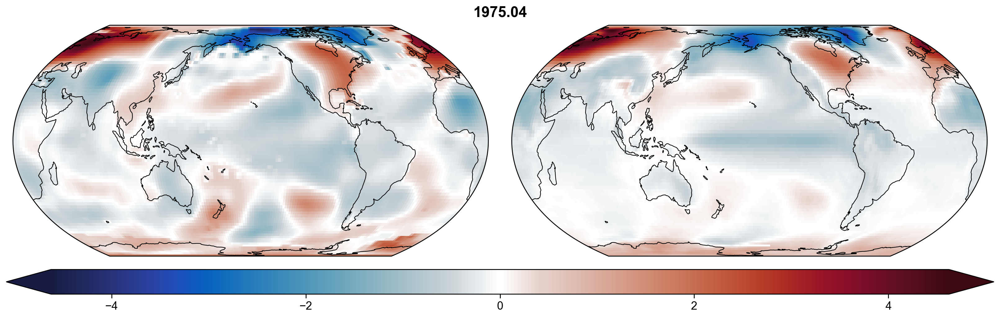

In [34]:
i = 300
fig, axs = subplots_cartopy(1, 2)
plot_field(axs, [
    da_tas.isel(time=i),
    da_tas_trunc.isel(time=i),
])
fig.suptitle(f"{da_tas.time[i]:.2f}")

In [35]:
da_tos = load_ersst()["tos"]
da_tos

<xarray.DataArray 'tos' (time: 596, lat: 90, lon: 180)> Size: 39MB
dask.array<xarray-tos, shape=(596, 90, 180), dtype=float32, chunksize=(596, 90, 180), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) float64 5kB 1.854e+03 1.855e+03 ... 2.003e+03 2.003e+03
  * lon      (lon) float64 1kB 0.0 2.0 4.0 6.0 8.0 ... 352.0 354.0 356.0 358.0
  * lat      (lat) float64 720B -89.0 -87.0 -85.0 -83.0 ... 83.0 85.0 87.0 89.0

In [36]:
da_tos_trunc = use_tuple_time_coords(mapper.truncate_dataset(da_tos.to_dataset(name="tos"))["tos"].compute())
da_tos_trunc

<xarray.DataArray 'tos' (time: 596, lat: 90, lon: 180)> Size: 77MB
array([[[            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        ...,
        [-1.58925552e-05, -1.77662610e-05, -1.96602865e-05, ...,
         -1.66946232e-05, -1.44956770e-05, -1.39942110e-05],
        [-8.13007969e-06, -8.12554791e-06, -8.44235331e-06, ...,
         -8.14740914e-06, -9.02092117e-06, -8.54731333e-06],
        [-1.59261691e-06, -1.18621343e-06, -1.25614154e-06, ...,
         -2.88415291e-06, -2.44249601e-06, -1.73558014e-06]],

       [[            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
...
         -1.95169891e-05, -2.00988860e-05, -2.26622891e-05],
        [-1.02974010e-05, -7.96427947e-06, -6.01140764e-06, ...,
         -1.70016555e-05, -1.64047748e-05, -1.26035047e-05],
        [-1.28885085e-05, -1.31520680e-05, -1.33604003e-05, ...,
         -1.39084881e-05, -1.38395763e-05, -1.31720255e-05]],

       [[            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        ...,
        [-3.24732985e-05, -3.26998025e-05, -2.83821810e-05, ...,
         -2.33383941e-05, -2.39731787e-05, -2.66969879e-05],
        [-8.11747269e-06, -5.01687066e-06, -2.87215173e-06, ...,
         -1.52190045e-05, -1.42553460e-05, -1.03267195e-05],
        [-1.17043984e-05, -1.16127690e-05, -1.15472221e-05, ...,
         -1.34531813e-05, -1.31442594e-05, -1.23610453e-05]]],
      shape=(596, 90, 180))
Coordinates:
  * lat      (lat) float64 720B -89.0 -87.0 -85.0 -83.0 ... 83.0 85.0 87.0 89.0
  * lon      (lon) float64 1kB 0.0 2.0 4.0 6.0 8.0 ... 352.0 354.0 356.0 358.0
  * time     (time) object 5kB MultiIndex
  * year     (time) int64 5kB 1854 1854 1854 1855 1855 ... 2002 2002 2002 2003
  * season   (time) object 5kB Season.MAM Season.JJA ... Season.SON Season.DJF

In [37]:
ds_calib = xr.merge([da_tas_trunc, da_tos_trunc])
ds_calib

<xarray.Dataset> Size: 177MB
Dimensions:  (lat: 90, lon: 180, time: 681)
Coordinates:
  * lat      (lat) float64 720B -89.0 -87.0 -85.0 -83.0 ... 83.0 85.0 87.0 89.0
  * lon      (lon) float64 1kB 0.0 2.0 4.0 6.0 8.0 ... 352.0 354.0 356.0 358.0
  * time     (time) object 5kB MultiIndex
  * year     (time) int64 5kB 1854 1854 1854 1855 1855 ... 2023 2023 2024 2024
  * season   (time) object 5kB Season.MAM Season.JJA ... Season.DJF Season.MAM
Data variables:
    tas      (time, lat, lon) float64 88MB nan nan nan nan ... 3.073 3.073 3.075
    tos      (time, lat, lon) float64 88MB nan nan nan nan ... nan nan nan nan

Text(0.5, 0.98, '1979.29')

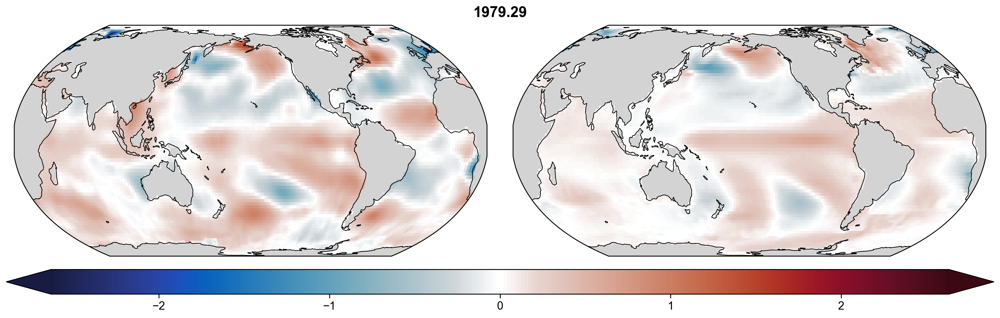

In [38]:
i = 500
fig, axs = subplots_cartopy(1, 2)
plot_field(axs, [
    da_tos.isel(time=i),
    da_tos_trunc.isel(time=i),
], shade_land=True)
fig.suptitle(f"{da_tos.time[i]:.2f}")

# Seasonal

(<Figure size 2400x800 with 2 Axes>,
 {'ts': <Axes: title={'center': 'pages2k_Ocn_090 (coral.d18O) @ (lat:-4.15, lon:144.88)'}, xlabel='Time [yr]', ylabel='d18O [permil]'>,
  'map': <GeoAxes: >})

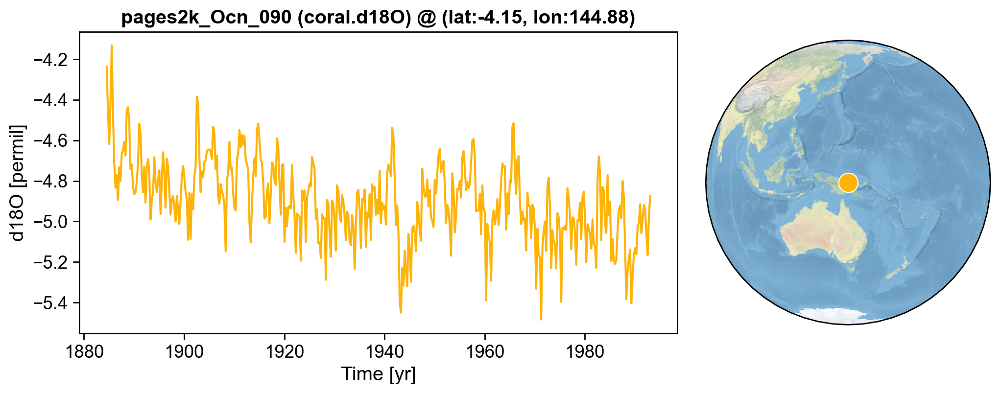

In [61]:
# proxy = list(pdb_seasonal.records.values())[20]
proxy = pdb_seasonal.records["pages2k_Ocn_090"]
da_proxy = use_tuple_time_coords(xr.DataArray(proxy.value, coords=dict(time=proxy.time)))
proxy.plot()

In [62]:
psms = {}

# da_calib = da_tas_trunc
da_calib = da_tos_trunc#.sel(time=slice(1900, None))
grid_lat, grid_lon = get_closest_gridpoint_with_data(proxy.lat, proxy.lon, da_calib)

for season in [Season.DJF, Season.MAM, Season.JJA, Season.SON]:
    da_calib_for_proxy, proxy_values_for_calib = xr.align(
        da_calib.sel(lat=grid_lat, lon=grid_lon).sel(season=season).dropna("year"),
        da_proxy.sel(season=season).dropna("year"),
        join="inner"
    )
    if len(da_calib_for_proxy) < 25:
        raise ValueError(f"Insufficient calibration data (less than 25 samples) for {proxy.pid}")
    psm = LinearPSM(proxy.pid, "tas", grid_lat, grid_lon, season)
    psm.calibrate(da_calib_for_proxy.data, proxy_values_for_calib.data, 4)
    psms[season] = psm

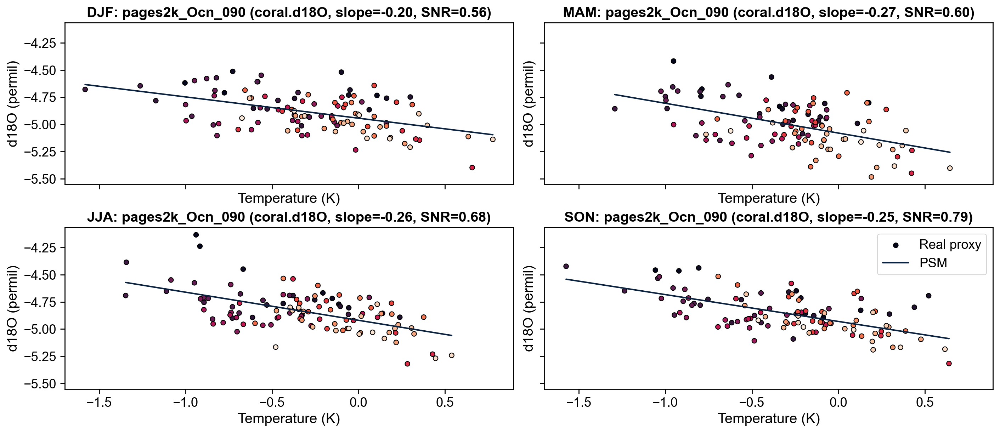

In [63]:
fig, axs = plt.subplots(2, 2, sharex="all", sharey="all")
for ax, season in zip(axs.flat, psms.keys()):
    psm = psms[season]

    da_calib_for_proxy, proxy_values_for_calib = xr.align(
        da_calib.sel(lat=grid_lat, lon=grid_lon).sel(season=season).dropna("year"),
        da_proxy.sel(season=season).dropna("year"),
        join="inner"
    )

    ax.scatter(da_calib_for_proxy.data, proxy_values_for_calib.data,
               c=da_calib_for_proxy.year, edgecolor='black', label="Real proxy")
    xx = np.linspace(da_calib_for_proxy.data.min(), da_calib_for_proxy.data.max(), 4)
    ax.plot(xx, psm._model.intercept_[0] + xx * psm._model.coef_[0, 0], label="PSM")
    ax.set_xlabel("Temperature (K)")
    ax.set_ylabel(f"{proxy.value_name} ({proxy.value_unit})")
    ax.set_title(f"{season.name}: {proxy.pid} ({proxy.ptype}, slope={psm._model.coef_[0][0]:.2f}, SNR={psm.SNR:.2f})")
ax.legend()

Text(0.5, 1.0, 'pages2k_Ocn_166 (coral.d18O, BIC=-855.6, SNR=0.55)')

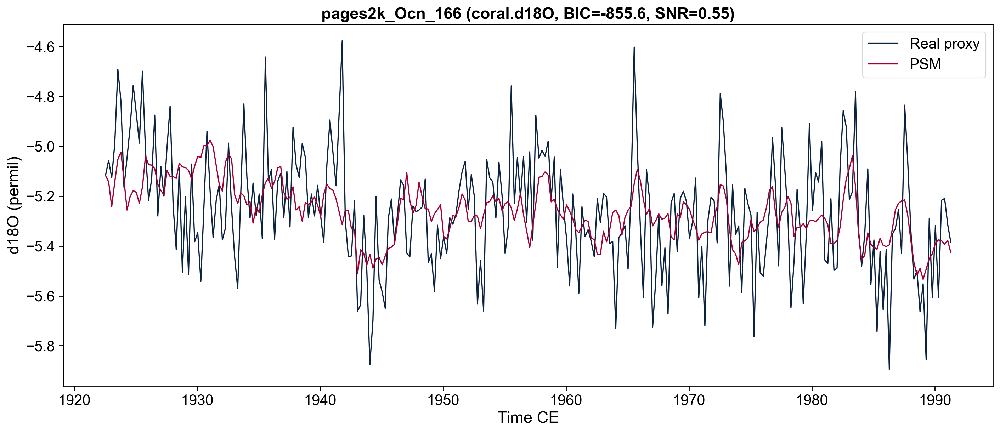

In [ ]:
da_calib_for_proxy = use_decimal_year_time_coords(da_calib_for_proxy)
fig, ax = plt.subplots()
ax.plot(da_calib_for_proxy.time, proxy_values_for_calib, label="Real proxy")
ax.plot(da_calib_for_proxy.time, psm.forward(da_calib_for_proxy)[0, :], label="PSM")
ax.set_xlabel("Time CE")
ax.set_ylabel(f"{proxy.value_name} ({proxy.value_unit})")
ax.legend()
ax.set_title(f"{proxy.pid} ({proxy.ptype}, BIC={psm.BIC:.1f}, SNR={psm.SNR:.2f})")

# Annual

(<Figure size 2400x800 with 2 Axes>,
 {'ts': <Axes: title={'center': 'pages2k_Ant_027 (borehole) @ (lat:-79.46, lon:247.88)'}, xlabel='Time [yr]', ylabel='temperature [degC]'>,
  'map': <GeoAxes: >})

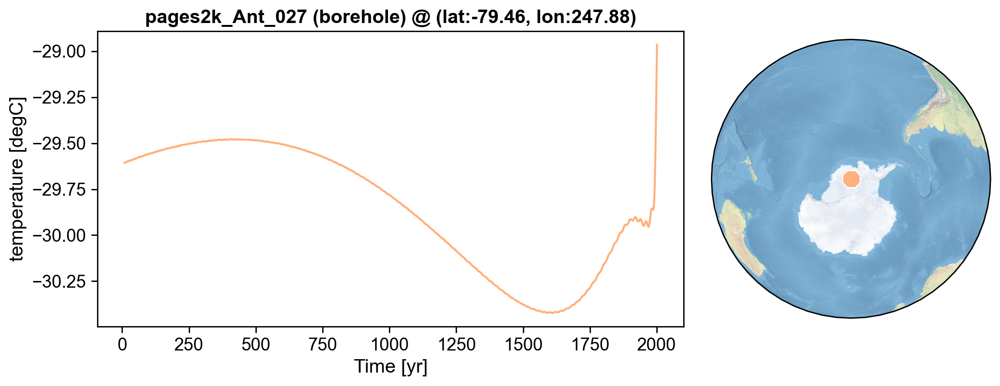

In [200]:
# proxy = list(pdb_annual.records.values())[80]
proxy = pdb_annual.records["pages2k_Ant_027"]
# proxy = pdb_annual.records["pages2k_Aus_031"]  # example of high error acor (0.87)
da_proxy = xr.DataArray(proxy.value, coords=dict(time=proxy.time))
proxy.plot()

In [201]:
seasonality_candidates = [
    [Season.DJF, Season.MAM, Season.JJA, Season.SON],
    [Season.SON, Season.DJF, Season.MAM, Season.JJA],
    [Season.JJA, Season.SON, Season.DJF, Season.MAM],
    [Season.MAM, Season.JJA, Season.SON, Season.DJF],
    [Season.JJA],
    [Season.MAM, Season.JJA],
    [Season.JJA, Season.SON],
    [Season.DJF],
    [Season.SON, Season.DJF],
    [Season.DJF, Season.MAM],
]

In [202]:
psm_candidates = []

for seasonality in seasonality_candidates:
    field = "tas"
    # field = "tos"
    grid_lat, grid_lon = get_closest_gridpoint_with_data(proxy.lat, proxy.lon, ds_calib[field])
    da_calib_annual = annualize_seasonal_data(ds_calib[field], seasonality)
    da_calib_for_proxy, proxy_values_for_calib = xr.align(
        da_calib_annual.sel(lat=grid_lat, lon=grid_lon).dropna("time"), da_proxy.dropna("time"), join="inner")
    if len(da_calib_for_proxy) < 25:
        raise ValueError("Insufficient calibration data (less than 25 for {proxy.pid}")
    psm = LinearPSM(proxy.pid, field, grid_lat, grid_lon, seasonality)
    psm.calibrate(da_calib_for_proxy.data, proxy_values_for_calib.data, 1)
    print(seasonality, np.abs(psm.corr), psm.annual_error_acor)
    if np.abs(psm.corr) < 0.05:
        continue
    psm_candidates.append(psm)

psm_opt = psm_candidates[np.argmin([psm.BIC for psm in psm_candidates])]

[<Season.DJF: 0>, <Season.MAM: 1>, <Season.JJA: 2>, <Season.SON: 3>] 0.311186187632581 0.8029184588262663
[<Season.SON: 3>, <Season.DJF: 0>, <Season.MAM: 1>, <Season.JJA: 2>] 0.2857580767165219 0.7984995268988953
[<Season.JJA: 2>, <Season.SON: 3>, <Season.DJF: 0>, <Season.MAM: 1>] 0.3007618131659605 0.8219589830095024
[<Season.MAM: 1>, <Season.JJA: 2>, <Season.SON: 3>, <Season.DJF: 0>] 0.29388446000623214 0.8379129871610093
[<Season.JJA: 2>] 0.32807130842124066 0.7562233546208331
[<Season.MAM: 1>, <Season.JJA: 2>] 0.28002931526205277 0.7983572739648254
[<Season.JJA: 2>, <Season.SON: 3>] 0.3921848975955546 0.7431326726946276
[<Season.DJF: 0>] 0.02822138918731282 0.8627406441244478
[<Season.SON: 3>, <Season.DJF: 0>] 0.20841257361911533 0.830473366825609
[<Season.DJF: 0>, <Season.MAM: 1>] 0.02685269262682632 0.8642829414969404


Text(0.5, 1.0, 'pages2k_Ant_027 (borehole, BIC=-360.4, SNR=0.43)')

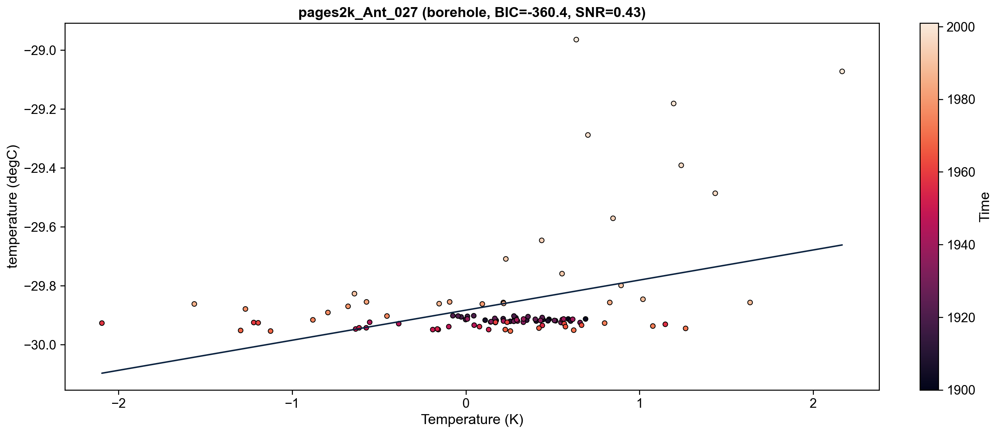

In [203]:
da_calib_annual = annualize_seasonal_data(ds_calib[field], psm_opt.seasonality)
da_calib_for_proxy, proxy_values_for_calib = xr.align(
    da_calib_annual.sel(lat=grid_lat, lon=grid_lon).dropna("time"), da_proxy.dropna("time"), join="inner")

fig, ax = plt.subplots()
scatter = ax.scatter(da_calib_for_proxy.data, proxy_values_for_calib.data,
                     c=da_calib_for_proxy.time, edgecolor='black', label="Real proxy")
fig.colorbar(scatter, ax=ax, label="Time")
xx = np.linspace(da_calib_for_proxy.data.min(), da_calib_for_proxy.data.max(), 4)
ax.plot(xx, psm_opt._model.intercept_[0] + xx * psm_opt._model.coef_[0, 0], label="PSM")
ax.set_xlabel("Temperature (K)")
ax.set_ylabel(f"{proxy.value_name} ({proxy.value_unit})")
ax.set_title(f"{proxy.pid} ({proxy.ptype}, BIC={psm_opt.BIC:.1f}, SNR={psm_opt.SNR:.2f})")

Text(0.5, 1.0, 'pages2k_Ant_027 (borehole)')

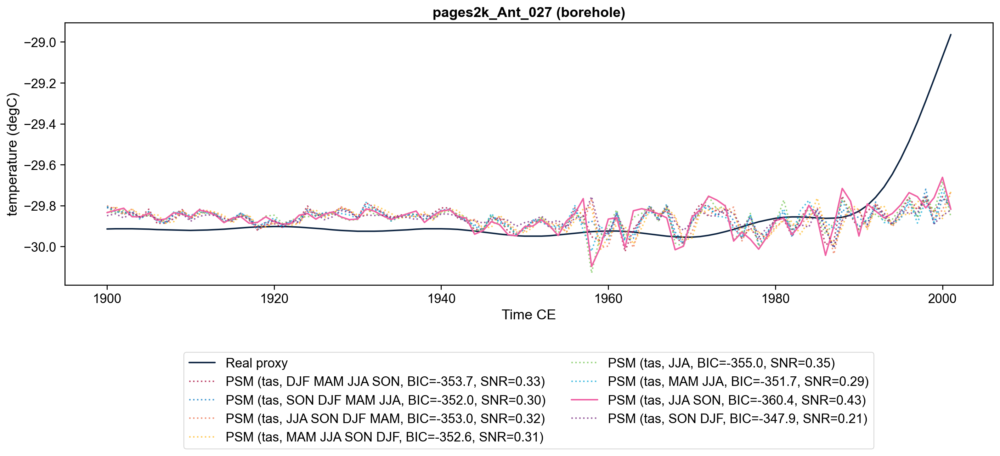

In [162]:
fig, ax = plt.subplots()
ax.plot(da_calib_for_proxy.time, proxy_values_for_calib, label="Real proxy")
for psm in psm_candidates:
    da_calib_annual = annualize_seasonal_data(ds_calib[psm.field], psm.seasonality)
    da_calib_for_proxy, proxy_values_for_calib = xr.align(
        da_calib_annual.sel(lat=grid_lat, lon=grid_lon).dropna("time"),
        da_proxy.dropna("time"),
        join="inner",
    )

    szn = " ".join(Season.to_str_list(psm.seasonality))
    ax.plot(
        da_calib_for_proxy.time,
        psm.forward(da_calib_for_proxy)[0, :],
        label=f"PSM ({psm.field}, {szn}, BIC={psm.BIC:.1f}, SNR={psm.SNR:.2f})",
        alpha=1 if psm == psm_opt else 0.7,
        ls="-" if psm == psm_opt else ":"
    )
ax.set_xlabel("Time CE")
ax.set_ylabel(f"{proxy.value_name} ({proxy.value_unit})")
ax.legend(bbox_to_anchor=(0.5, -0.65), loc="lower center", ncols=2)
ax.set_title(f"{proxy.pid} ({proxy.ptype})")

# Analysis of all calibrated proxies

In [188]:
obs_dataset = "obs/2025-04-04T17-55-28"
pdb_calib: cfr.ProxyDatabase = pickle.load((get_data_path() / f"{obs_dataset}/pdb.pkl").open("rb")).slice((850, 2000))
psms_calib = pickle.load((get_data_path() / f"{obs_dataset}/psms.pkl").open("rb"))

Slicing ProxyRecord: 100%|██████████| 640/640 [00:02<00:00, 247.78it/s] 


In [186]:
pdb_calib["ch2k_DR99ABR01_d18O"]

In [189]:
len(pdb_calib.records)

640

(<Figure size 2400x2000 with 2 Axes>,
 {'map': <GeoAxes: >,
  'count': <Axes: xlabel='Year (AD)', ylabel='number of proxies'>})

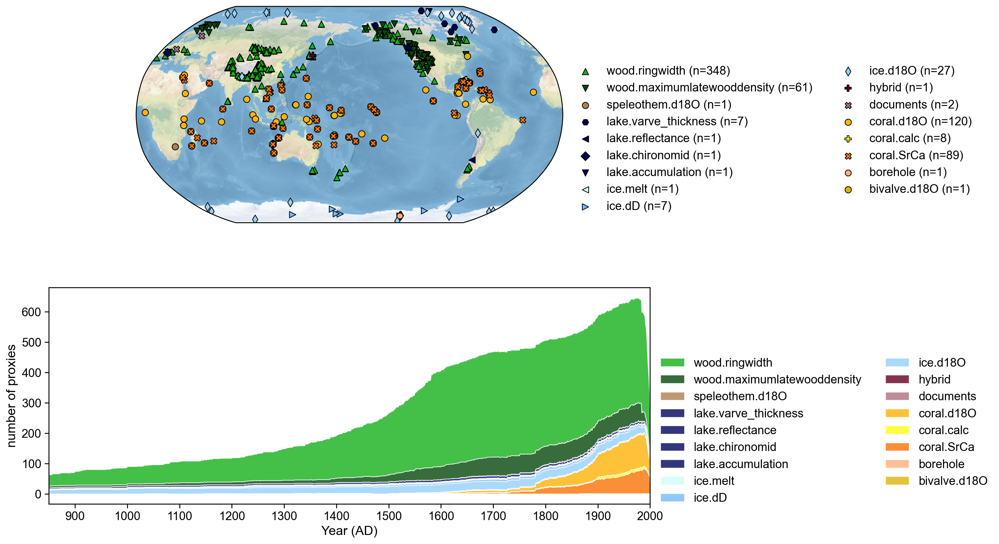

In [177]:
pdb_calib.plot(
    plot_count=True,
    year=np.arange(850, 2000+1),
    plot_xticks=np.arange(900, 2001, 100),
    plot_timespan=(850, 2000),
    figsize=(12, 10),
    lgd_ncol=2
)

Slicing ProxyRecord: 100%|██████████| 333/333 [00:00<00:00, 640.56it/s] 


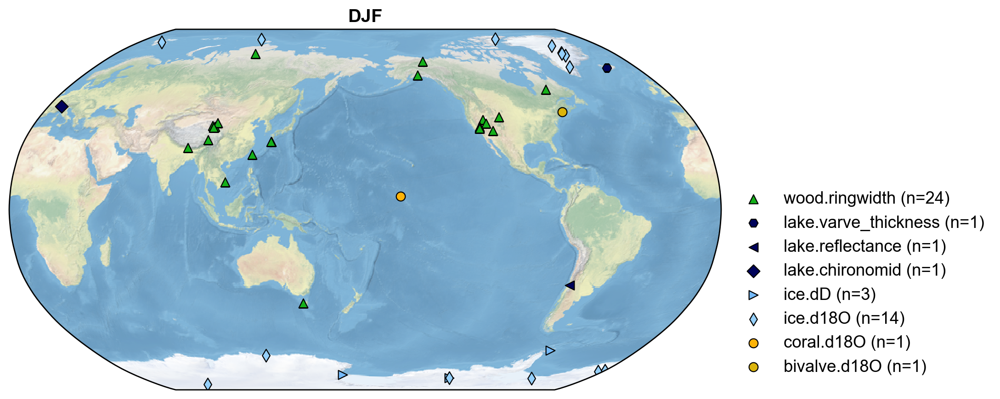

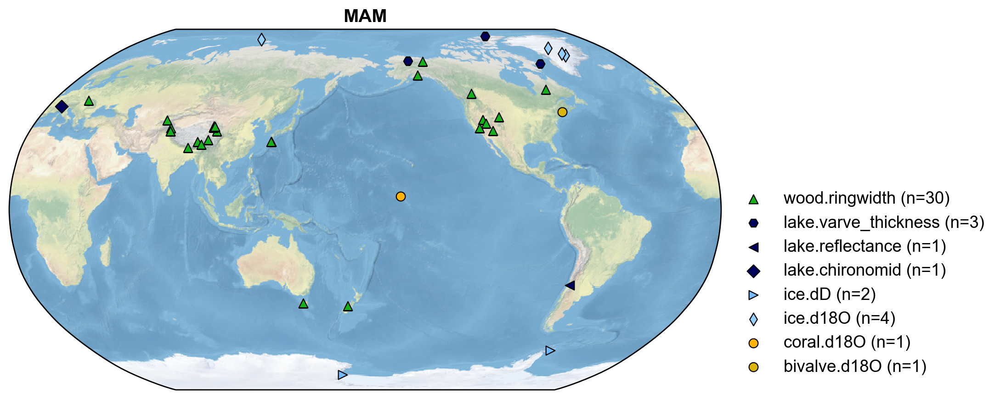

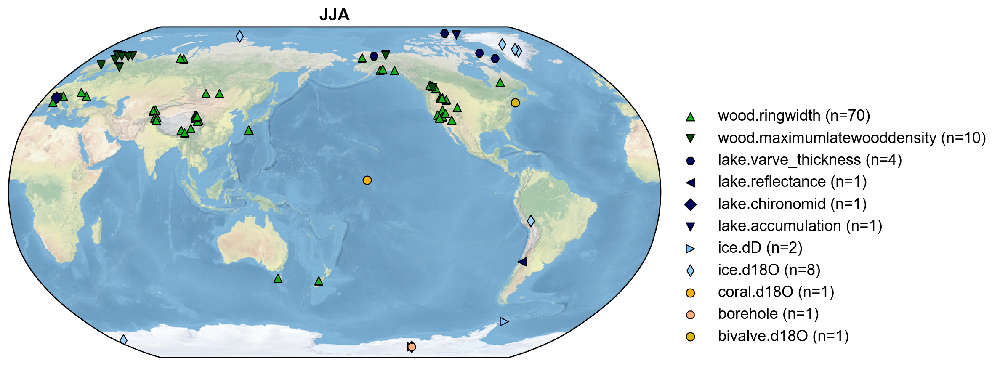

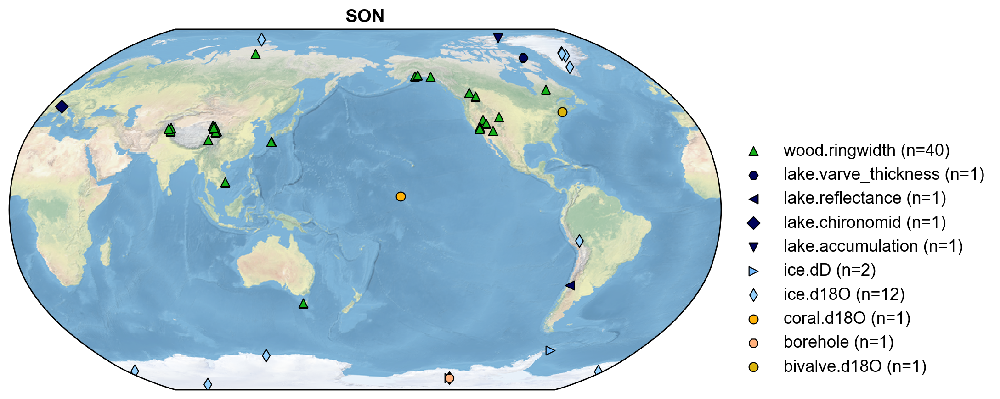

In [11]:
def plot_proxies_by_season(slice=None):
    proxies_by_season = {season: [] for season in [Season.DJF, Season.MAM, Season.JJA, Season.SON]}
    for pid, psm in psms_calib.items():
        pobj = pdb_calib[pid]
        if isinstance(psm, dict):
            for season in psm.keys():
                proxies_by_season[season].append(pobj)
        else:
            for season in psm.seasonality:
                proxies_by_season[season].append(pobj)
    
    for season, pobjs in proxies_by_season.items():
        pdb = cfr.ProxyDatabase({pobj.pid: pobj for pobj in pobjs})
        if slice:
            pdb = pdb.slice((850, 1200))
            pdb = cfr.ProxyDatabase(
                {pid: pobj for pid, pobj in pdb.records.items() if len(pobj.time) > 0}
            )
        fig, ax = pdb.plot()
        ax["map"].set_title(season.name)

# plot_proxies_by_season()
plot_proxies_by_season((850, 1050))

In [48]:
def plot_calibration_stats():
    lats = []
    lons = []
    corrs = []
    acorrs = []
    snrs = []
    for pid, psm in psms_calib.items():
        if isinstance(psm, dict):
            psm1 = list(psm.values())[0]
            lat = psm1.lat
            lon = psm1.lon
            corr = np.mean([np.abs(psm_.corr) for psm_ in psm.values()])
            print([psm_.annual_error_acor for psm_ in psm.values()])
            acorr = np.mean([psm_.annual_error_acor for psm_ in psm.values()])
            snr = np.mean([psm_.SNR for psm_ in psm.values()])
        else:
            lat = psm.lat
            lon = psm.lon
            corr = np.abs(psm.corr)
            acorr = psm.annual_error_acor
            snr = psm.SNR
        
        if pid in pdb_calib.records:
            lats.append(lat)
            lons.append(lon)
            corrs.append(corr)
            acorrs.append(acorr)
            snrs.append(snr)

    fig, axs = subplots_cartopy(1, 2, figsize=(16, 7))
    axs[0].scatter(lons, lats, c=corrs,
                   cmap="YlOrRd", s=70, edgecolors="black", alpha=0.8,
                   transform=ccrs.PlateCarree(), vmin=0, vmax=1)
    axs[0].set_title("PSM calibration correlation")
    axs[1].scatter(lons, lats, c=acorrs,
                   cmap="YlOrRd", s=70, edgecolors="black", alpha=0.8,
                   transform=ccrs.PlateCarree(), vmin=0, vmax=1)
    axs[1].set_title("PSM residual autocorrelation")
    fig.colorbar(axs[0].collections[0], ax=axs, orientation='horizontal',
                 fraction=0.03, pad=0.05, aspect=50, extend="min")

    for ax in axs:
        ax.set_global()
        ax.stock_img()
        ax.coastlines()
    

    fig, ax = plt.subplots(figsize=(6, 4))
    ax.patch.set_visible(False)
    ax_hist = ax.twinx()
    ax.set_zorder(ax_hist.get_zorder()+1)
    ax_hist.hist(corrs, bins=20, alpha=0.99, color='gray', density=True)
    ax_hist.set_ylim(0, 15)
    ax_hist.set_yticks([])
    ax.scatter(corrs, snrs)
    ax.set_xlabel("Correlation")
    ax.set_ylabel("SNR")
    ax.set_xlim(0, 1)

plot_calibration_stats()

[None, None, None, None]


TypeError: unsupported operand type(s) for +: 'NoneType' and 'NoneType'

Text(0.5, 1.0, 'Total # proxies: 635')

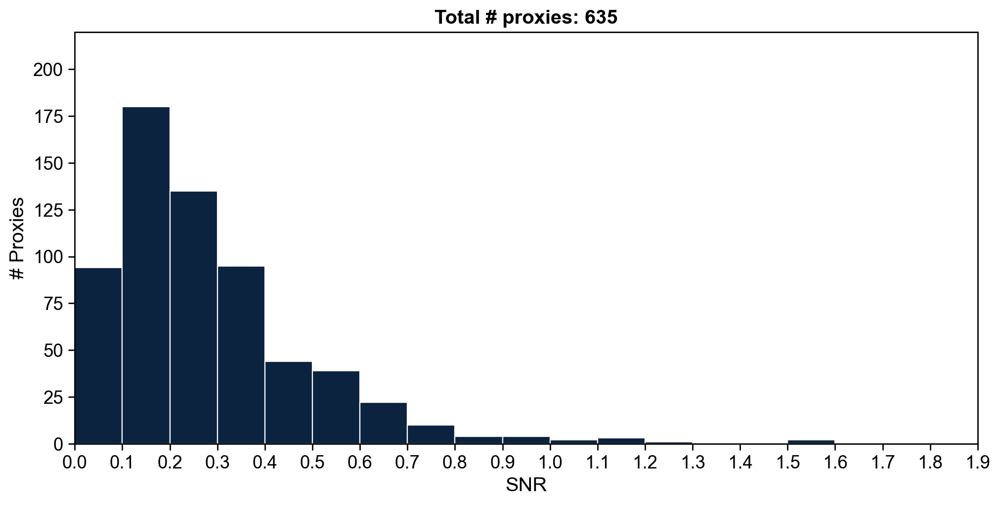

In [117]:
snr = []
for psm_or_dict in psms_calib.values():
    if isinstance(psm_or_dict, dict):
        snr.append(np.median([psm.SNR for psm in psm_or_dict.values()]))
    else:
        snr.append(psm_or_dict.SNR)

fig, ax = plt.subplots(figsize=(10, 5))
bins = np.linspace(0, 1.9, 20)
ax.hist(snr, bins=bins)
ax.set_xlabel("SNR")
ax.set_ylabel("# Proxies")
ax.set_xlim(0, 1.9)
ax.set_ylim(0, 220)
ax.set_xticks(bins)
ax.set_title(f"Total # proxies: {len(psms_calib)}")

## High-SNR proxies

Plot proxies with high SNR since they have an outsized impact on temperature reconstruction

In [345]:
pids_highsnr = [pid for pid, p in psms_calib.items() if p.SNR > 0.9]
for pid in pids_highsnr:
    print(f"{pid} {pdb_calib[pid].ptype} {psms[pid].SNR:.2f}")
pdb_highsnr = cfr.ProxyDatabase({
    pid: pdb_calib.records[pid] for pid in pids_highsnr
})
pdb_highsnr.plot()

AttributeError: 'dict' object has no attribute 'SNR'

(<Figure size 2400x800 with 2 Axes>,
 {'ts': <Axes: title={'center': 'pages2k_Eur_011 (documents) @ (lat:49.00, lon:13.00)'}, xlabel='Time [yr]', ylabel='temperature [degC]'>,
  'map': <GeoAxes: >})

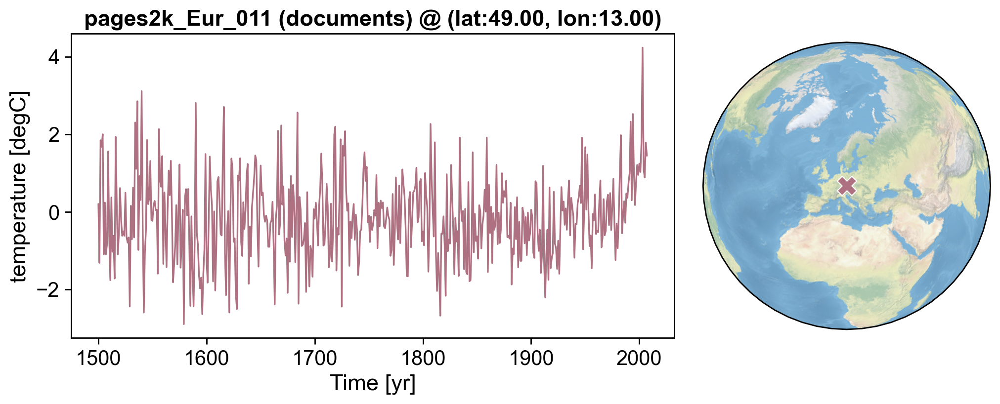

In [25]:
pdb["pages2k_Eur_011"].plot()